In [1]:
import http.client, base64, requests, json
import numpy as np
from IPython.core.display import display, HTML
#from IPython.display import Image
%matplotlib inline
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO

## Let's have some fun with celebrities
Below are some images, for celebrity identification, note the differences in appearance and the impact on the outputs

In [4]:
def find_celebrity(image_path):
    vision_base_url = "https://westcentralus.api.cognitive.microsoft.com/vision/v1.0/"
    
    celebrity_analyze_url = vision_base_url + "models/celebrities/analyze"
    
    
    headers  = {
        'Ocp-Apim-Subscription-Key': '97eacc3d4b784a799f32cfd0e5c6fd46',
        'Content-Type': 'application/octet-stream'
    }
    params   = {
        'visualFeatures': 'Categories,Description,Tags,Color',
        'model': 'celebrities'
    }

    with open(image_path, 'rb') as f:
        img_data = f.read()

    #image_data = Image.open(BytesIO(img_data))
    #data     = {'url': image_data}

    response = requests.post(celebrity_analyze_url, headers=headers, params=params, data=img_data)
    return json.dumps(json.loads(response.text), sort_keys=True, indent=2)

def find_landmark(image_path):
    '''TODO'''
    landmark_analyze_url = vision_base_url + "models/landmarks/analyze"
    headers  = {
        'Ocp-Apim-Subscription-Key': '97eacc3d4b784a799f32cfd0e5c6fd46',
        'Content-Type': 'application/octet-stream'
    }
    params   = {
        'visualFeatures': 'Categories,Description,Tags,Color'
    }
    with open(image_path, 'rb') as f:
        img_data = f.read()
    response = requests.post(landmark_analyze_url, headers=headers, params=params, data=img_data)
    return json.dumps(json.loads(response.text), sort_keys=True, indent=2)

def recognize_text_from_handwriting(image_path):
    '''
    TODO
    The text recognition service doesn't directly return the recognized text. Instead, it returns immediately with an "Operation Location" URL in the response header. You must poll the URL to get the result of the operation:
    operation_url = response.headers["Operation-Location"]
    After you obtain the operation_url, you can query the URL for the analyzed text. The following code implements a polling loop to wait for the operation to complete. Polling is done by using an HTTP GET method instead of POST.
    import time

    analysis = {}
    while not "recognitionResult" in analysis:
        response_final = requests.get(response.headers["Operation-Location"], headers=headers)
        analysis       = response_final.json()
        time.sleep(1)
    Next, extract the recognized text, with bounding boxes:
    polygons = [(line["boundingBox"], line["text"]) for line in analysis["recognitionResult"]["lines"]]
    '''
    text_recognition_url = vision_base_url + "RecognizeText"
    headers  = {
        'Ocp-Apim-Subscription-Key': '97eacc3d4b784a799f32cfd0e5c6fd46',
        'Content-Type': 'application/octet-stream',        
    }
    params   = {
        'visualFeatures': 'Categories,Description,Tags,Color',
        'handwriting' : True,
        'language': 'unk', 
        'detectOrientation ': 'true'
    }
    with open(image_path, 'rb') as f:
        img_data = f.read()
    response = requests.post(text_recognition_url, headers=headers, params=params, data=img_data)
    
    return json.dumps(json.loads(response.text), sort_keys=True, indent=2)

In [5]:
resp_priyanka_chopra_1 = find_celebrity(r'../data/images/celebrities/priyanka-chopra-1.jpg')
resp_priyanka_chopra_2 = find_celebrity(r'../data/images/celebrities/priyanka-chopra-2.jpg')
resp_priyanka_chopra_3 = find_celebrity(r'../data/images/celebrities/priyanka-chopra-3.jpg')
resp_priyanka_chopra_4 = find_celebrity(r'../data/images/celebrities/priyanka-chopra-4.jpg')


Priyanka Chopra


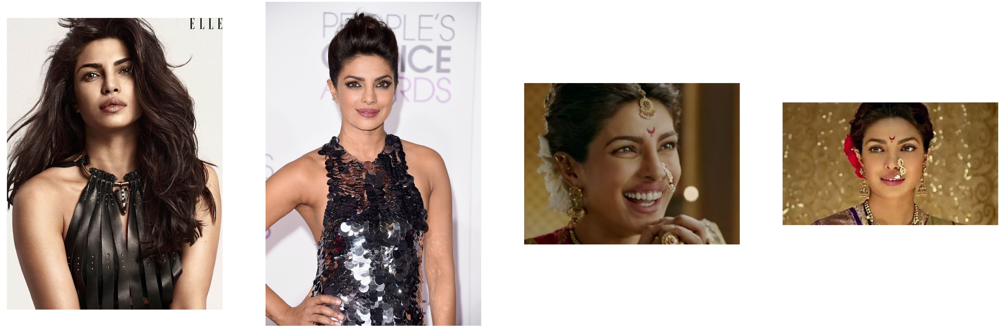

In [7]:
image_urls = ['priyanka-chopra-'+'1.jpg', 'priyanka-chopra-'+'2.jpg', 'priyanka-chopra-'+'3.jpg', 'priyanka-chopra-'+'4.jpg']
image_path = r'../data/images/celebrities/'
f, axes = plt.subplots(1, 4,figsize=(100,100))
for i in range(4):
    selected_image = image_path+image_urls[i]
    image = Image.open(selected_image)
    axes[i].imshow(image)
    axes[i].axis("off")

print("Priyanka Chopra")

In [6]:
print('-----')
print(resp_priyanka_chopra_1)
print('-----')
print(resp_priyanka_chopra_2)
print('-----')
print(resp_priyanka_chopra_3)
print('-----')
print(resp_priyanka_chopra_4)
print('-----')

-----
{
  "metadata": {
    "format": "Jpeg", 
    "height": 1084, 
    "width": 800
  }, 
  "requestId": "ca18c0ec-1948-47e8-a9e8-a801951d2ab4", 
  "result": {
    "celebrities": []
  }
}
-----
{
  "metadata": {
    "format": "Jpeg", 
    "height": 1805, 
    "width": 1200
  }, 
  "requestId": "fdd042f2-1aae-46a4-8b0c-692ddb49e07d", 
  "result": {
    "celebrities": [
      {
        "confidence": 0.9957916736602783, 
        "faceRectangle": {
          "height": 324, 
          "left": 406, 
          "top": 362, 
          "width": 324
        }, 
        "name": "Priyanka Chopra"
      }
    ]
  }
}
-----
{
  "metadata": {
    "format": "Jpeg", 
    "height": 480, 
    "width": 640
  }, 
  "requestId": "9b0669bb-0010-4049-aeb5-4442c5f441bd", 
  "result": {
    "celebrities": [
      {
        "confidence": 0.9991104006767273, 
        "faceRectangle": {
          "height": 291, 
          "left": 225, 
          "top": 113, 
          "width": 291
        }, 
        "name": "Priy

## TODO Repeat these for the ones below

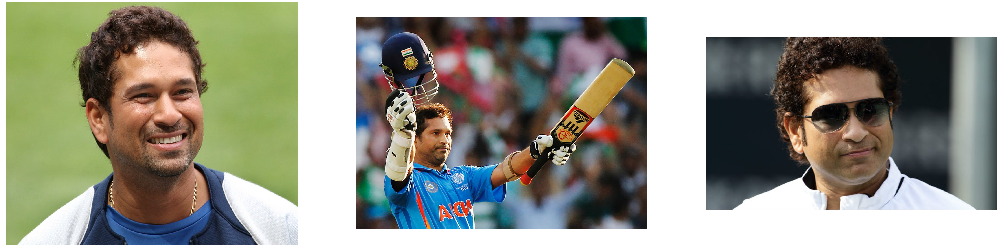

In [4]:
image_urls =  ['sachin-tendulkar-'+'1.jpg', 'sachin-tendulkar-'+'2.jpg', 'sachin-tendulkar-'+'3.jpg']
image_path = r'../data/images/celebrities/'
f, axes = plt.subplots(1, 3, figsize=(100,100))
for i in range(3):
    selected_image = image_path+image_urls[i]
    image = Image.open(selected_image)
    axes[i].imshow(image)
    axes[i].axis("off")
    
print("Sachin Tendulkar")

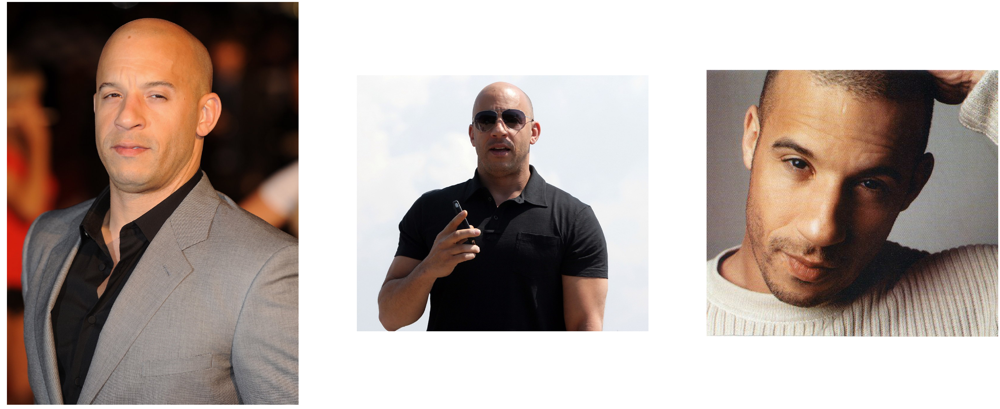

In [6]:
image_urls =  ['vin_diesel-'+'1.jpg', 'vin_diesel-'+'2.jpg', 'vin_diesel-'+'3.jpg']
image_path = r'../data/images/celebrities/'
f, axes = plt.subplots(1, 3, figsize=(100,100))
for i in range(3):
    selected_image = image_path+image_urls[i]
    image = Image.open(selected_image)
    axes[i].imshow(image)
    axes[i].axis("off")
    
print("Vin Diesel")

In [ ]:
subscription_key = '9ae23c2612aa4b73a1a63f101b06f3ca' # Change to be your API key.
uri_base = 'https://westus.api.cognitive.microsoft.com/qnamaker/v2.0' # Change to match your region.
qna_endpoint =  r'/knowledgebases/cfe481c7-1951-44f4-8038-09e634a26e1a/generateAnswer'
headers = {
    'Content-Type': 'application/json',
    'Ocp-Apim-Subscription-Key': subscription_key,
}
params = {}